<div style="width:image width px; font-size:75%; text-align:right;">
    <img src="img/danielle-macinnes-IuLgi9PWETU-unsplash.jpg" width="width" height="height" style="padding-bottom:0.2em;" />
    <figcaption>Photo by Danielle MacInnes on Unsplash</figcaption>
</div>

# Introduction to Machine Learning

**Applied Programming - Summer term 2023 - FOM Hochschule für Oekonomie und Management - Cologne**

**Lecture 06 - May 12, 2023**

*Dennis Gluesenkamp*

## Table of contents
* [Introduction](#introduction)
* [Dataset creation](#datasetcreation)
    * [Classification](#datasetcreation_classification)
    * [Regression](#datasetcreation_regression)
* [The decision tree as the first reference model](#decisiontree)
    * [Classification](#decisiontree_classification)
    * [Regression](#decisiontree_regression)
* [References](#references)

## Introduction<a class="anchor" id="introduction"></a>

In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

np.random.seed(42)

## Dataset creation<a class="anchor" id="datasetcreation"></a>
In order to get a step-by-step understanding of the topic, application and functionality of Machine Learning, we will first use artificially generated data sets for initial, simple models. This allows us to get to know the structure of modeling with scikit-learn and thus forms the basis for later, more complex applications. The generated datasets may be focused on classification or regression problems and include features that do not claim to represent real values of any particular magnitude or characteristic. Thus, they are simply numerical columns without (physical) units.

### Classification<a class="anchor" id="datasetcreation_classification"></a>
First, we want to generate a dataset for a classification problem, and we can call the ``make_classification()`` function to do this, which is located in the ``datasets`` module of scikit-learn. [[1]](#sklearn2021a)

In [6]:
from sklearn.datasets import make_classification

In [15]:
# Let's check output of function directly
make_classification()

(array([[-2.02514259,  0.0291022 , -0.47494531, ..., -0.33450124,
          0.86575519, -1.20029641],
        [ 1.61371127,  0.65992405, -0.15005559, ...,  1.37570681,
          0.70117274, -0.2975635 ],
        [ 0.16645221,  0.95057302,  1.42050425, ...,  1.18901653,
         -0.55547712, -0.63738713],
        ...,
        [-0.03955515, -1.60499282,  0.22213377, ..., -0.30917212,
         -0.46227529, -0.43449623],
        [ 1.08589557,  1.2031659 , -0.6095122 , ..., -0.3052247 ,
         -1.31183623, -1.06511366],
        [-0.00607091,  1.30857636, -0.17495976, ...,  0.99204235,
          0.32169781, -0.66809045]]),
 array([0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0,
        0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0,
        0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1,
        0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1,
        1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0]))

In [16]:
pd.DataFrame(make_classification()[0]).describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
count,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
mean,0.050009,0.182902,0.157961,0.013065,-0.005725,0.011893,-0.075997,-0.090215,0.049004,-0.027507,0.063556,-0.028245,-0.061140,-0.004616,-0.220921,-0.120975,0.029063,0.104513,-0.186456,0.150162
std,0.959379,0.932613,0.928127,0.962783,1.113943,0.939813,1.431209,0.935033,1.343672,0.996805,1.082154,0.952018,1.103771,1.053305,0.978055,1.176153,0.955164,0.969399,1.073465,0.929554
min,-1.944902,-2.363968,-1.931377,-2.397499,-2.924925,-2.407344,-4.060017,-2.517143,-2.518249,-2.543498,-3.386814,-2.165482,-1.522271,-2.427203,-2.843485,-2.626786,-2.407868,-2.166381,-3.339500,-2.537389
25%,-0.815392,-0.440506,-0.617316,-0.561224,-0.905596,-0.659279,-1.184675,-0.492064,-1.081592,-0.656412,-0.639514,-0.728679,-0.999198,-0.820901,-0.823062,-0.920961,-0.594736,-0.645656,-0.855208,-0.403881
50%,0.206165,0.156352,0.074618,-0.002762,0.176929,-0.130523,-0.346877,-0.026034,0.157579,-0.068533,0.066721,0.002478,-0.674396,-0.050379,-0.221224,-0.240080,-0.001041,0.266445,-0.247270,0.164268
75%,0.789761,0.856743,0.778270,0.547594,0.827692,0.747419,1.169425,0.488199,1.165874,0.564688,0.802801,0.604951,0.926910,0.844560,0.583518,0.713737,0.709890,0.824396,0.697721,0.742361
max,2.732732,2.479389,2.920753,2.684346,2.114332,2.533516,2.925617,2.045817,3.792858,3.495878,2.333757,1.988768,2.794762,2.429144,1.420257,2.562528,2.429283,2.256272,2.136559,2.267180


In [17]:
pd.DataFrame(make_classification()[1]).describe()

,0
count,100.000000
mean,0.490000
std,0.502418
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,1.000000


In [10]:
X0, y0 = make_classification(n_features           = 2,
                             n_informative        = 2,
                             n_redundant          = 0,
                             n_repeated           = 0,
                             n_clusters_per_class = 2)

In [11]:
print(X0.shape)
print(y0.shape)

(100, 2)
(100,)


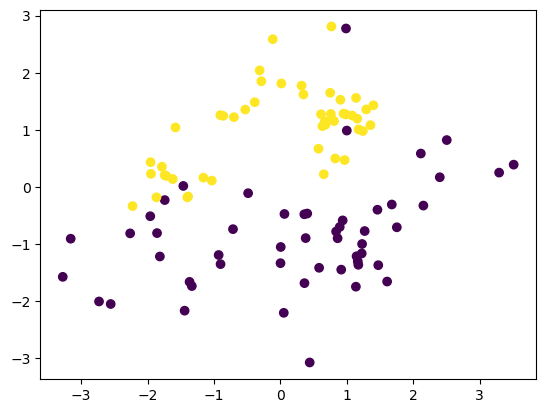

In [12]:
plt.scatter(X0[:, 0], X0[:, 1],
            marker = 'o',
            c      = y0)
plt.draw()

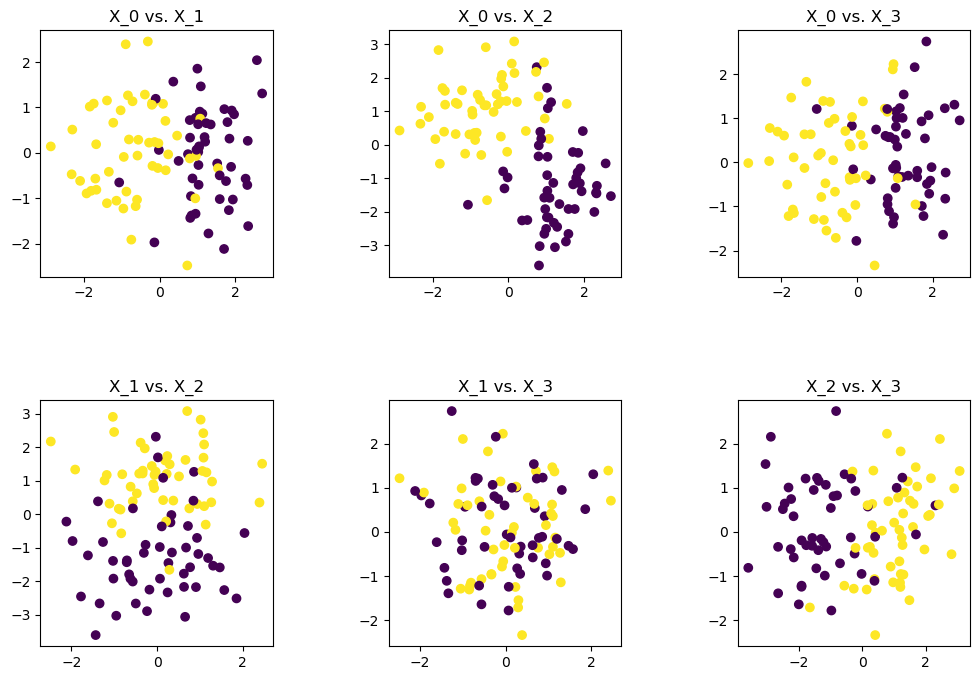

In [18]:
Xc, yc = make_classification(n_features           = 6,
                             n_informative        = 4,
                             n_redundant          = 0,
                             n_repeated           = 0,
                             n_clusters_per_class = 1,
                             random_state         = 123)

plt.figure(figsize = (12, 8))
plt.subplots_adjust(wspace = .5, hspace = .5)
plt.subplot(2, 3, 1)
plt.scatter(Xc[:, 0], Xc[:, 1],
            marker = 'o',
            c      = yc)
plt.title('X_0 vs. X_1')

plt.subplot(2, 3, 2)
plt.scatter(Xc[:, 0], Xc[:, 2],
            marker = 'o',
            c      = yc)
plt.title('X_0 vs. X_2')

plt.subplot(2, 3, 3)
plt.scatter(Xc[:, 0], Xc[:, 3],
            marker = 'o',
            c      = yc)
plt.title('X_0 vs. X_3')

plt.subplot(2, 3, 4)
plt.scatter(Xc[:, 1], Xc[:, 2],
            marker = 'o',
            c      = yc)
plt.title('X_1 vs. X_2')

plt.subplot(2, 3, 5)
plt.scatter(Xc[:, 1], Xc[:, 3],
            marker = 'o',
            c      = yc)
plt.title('X_1 vs. X_3')

plt.subplot(2, 3, 6)
plt.scatter(Xc[:, 2], Xc[:, 3],
            marker = 'o',
            c      = yc)
plt.title('X_2 vs. X_3')

plt.draw()

In [19]:
# Create a DataFrame of the arrays
dfc = pd.DataFrame(np.c_[Xc, yc])
dfc

,0,1,2,3,4,5,6
0,0.749201,-0.028869,2.312806,0.600660,5.100150,4.681691,0.0
1,-0.875829,-0.854163,0.137335,-1.304681,0.501743,-1.091356,1.0
2,-0.944812,-0.089614,0.896005,-0.784831,1.047849,-0.431471,1.0
3,-1.673899,0.189492,1.603466,0.112707,0.289196,-2.021954,1.0
4,1.791187,0.677320,-0.997373,0.542171,3.344389,3.618464,0.0
...,...,...,...,...,...,...,...
95,0.942196,-1.003429,2.455265,2.105075,2.256011,-0.595966,1.0
96,-1.842801,1.018963,2.822997,-0.504778,0.416844,-3.117302,1.0
97,-2.320655,-0.472584,0.621794,0.028352,2.453334,1.356899,1.0
98,2.706926,1.309350,-1.538845,0.950470,2.274352,2.704643,0.0


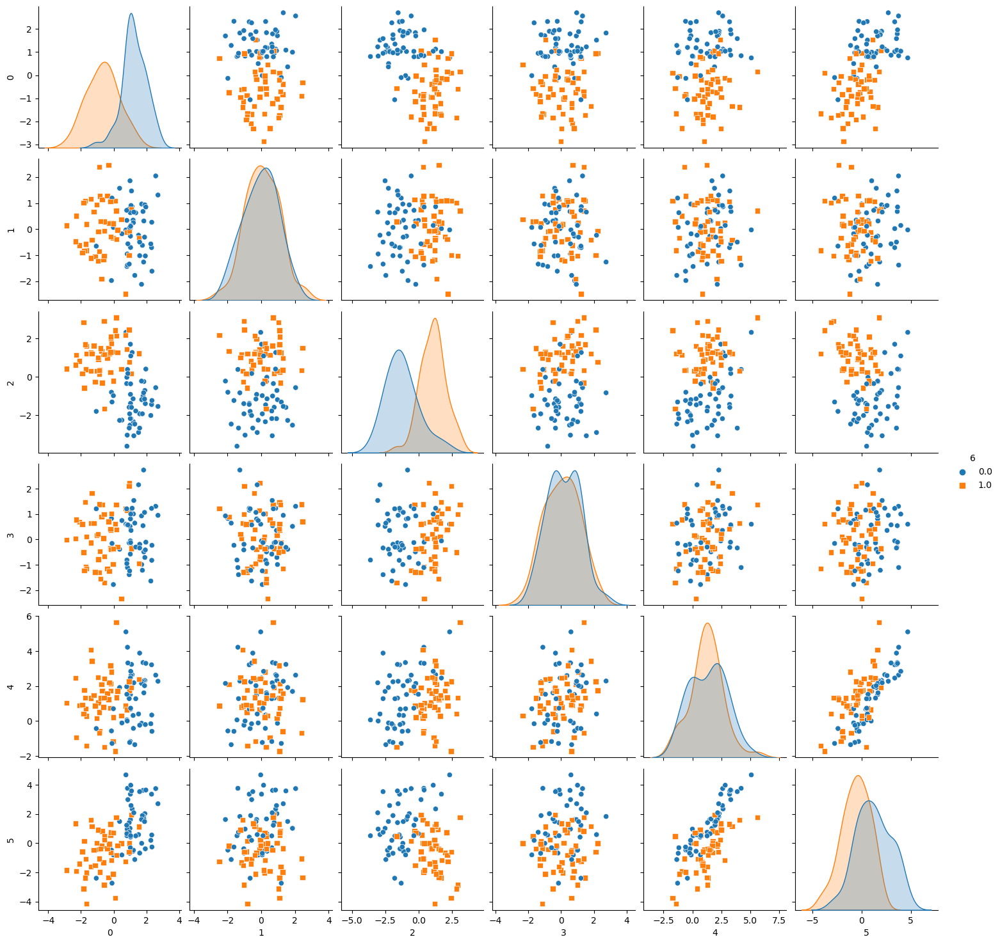

In [20]:
sns.pairplot(dfc, hue = 6, markers=['o', 's'])
plt.draw()

### Regression<a class="anchor" id="datasetcreation_regression"></a>
In the second step, we also create a randomly generated regression problem. Here we access the function ``make_regression()``, which works analogously to the one from the classification [[1]](#sklearn2021a). We keep the most defaults. The only exception is the number of features, because we want to be able to plot the distributions of the dataset.

In [21]:
from sklearn.datasets import make_regression
make_regression()

(array([[ 1.22918363,  0.06558097, -0.4214623 , ..., -1.08629166,
          0.48295673,  0.50405034],
        [-0.61963642,  0.90120678, -1.42399385, ...,  0.0301464 ,
         -0.46394797, -1.27826263],
        [ 1.53290647,  0.60372558,  0.38925692, ..., -1.59831318,
         -0.42632587,  0.65134598],
        ...,
        [ 0.32470238,  0.53428538,  0.53450755, ...,  2.01872491,
          1.82434953,  1.11525049],
        [ 0.89552554, -0.69602016,  0.6164221 , ...,  0.654128  ,
          0.9933345 ,  0.53940199],
        [-1.46924058, -1.29298135, -0.21756369, ..., -2.28301037,
         -0.66914275,  0.59791351]]),
 array([ 1.26923462e+02,  4.64833571e+02,  1.84876131e+02, -3.78926809e+01,
         5.89157783e+01,  5.66699523e+01, -3.37187246e+00,  3.81898924e+02,
         1.14806481e+02, -4.87228559e+01, -1.40153695e+01,  2.07070515e+02,
        -2.07065232e+02, -2.40203131e+02,  4.50782782e+02, -6.18183437e+01,
         1.67192489e+01, -1.30673901e+02, -1.22770945e+02,  2.5113360

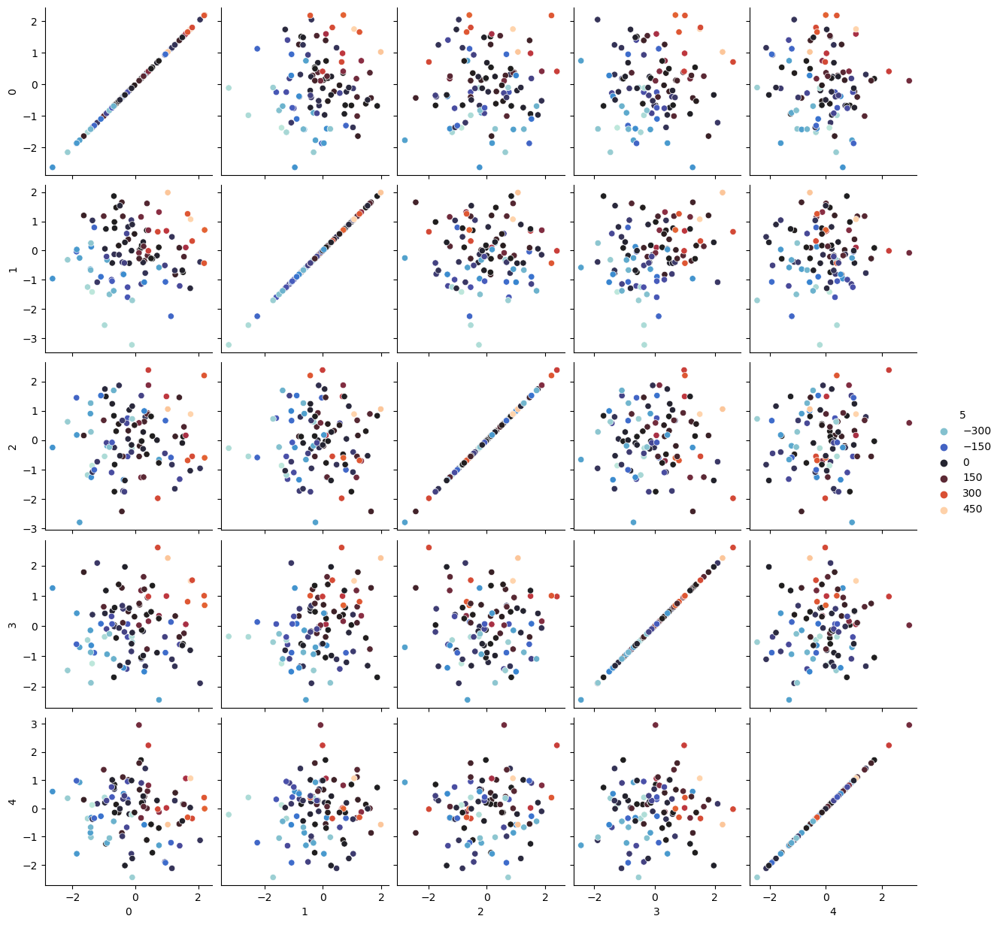

In [22]:
Xr, yr = make_regression(n_features   = 5,
                         random_state = 123)

dfr = pd.DataFrame(np.c_[Xr, yr])
sns.pairplot(dfr, hue = 5, palette = 'icefire', diag_kind = None)
plt.draw()

### Exercises<a class="anchor" id="datasetcreation_exercises"></a>
1. Go to the User Guide of scikit-learn to the chapter of "Toy Datasets designed for training" [[2]](#sklearn2021b). Now select one dataset each for regression and classification from the datasets offered there and familiarize yourself with the parameter ``return_X_y`` and (if available) ``as_frame`` and use them appropriately.
2. Import the necessary modules for the datasets you selected and create the data for each, as shown above for the generators. Choose some appropriate names which are different to the names for the generator datasets above.
3. Create a pairplot for each of the regression and classification and evaluate the results. **Be careful:** Using a dataset with a lot of features can lead to an extensive calcultation time! As an alternative, you can plot only some of the features.

In [52]:
from sklearn.datasets import load_wine, load_diabetes


wines = load_wine(as_frame=True)
diabetes = load_diabetes(as_frame=True)

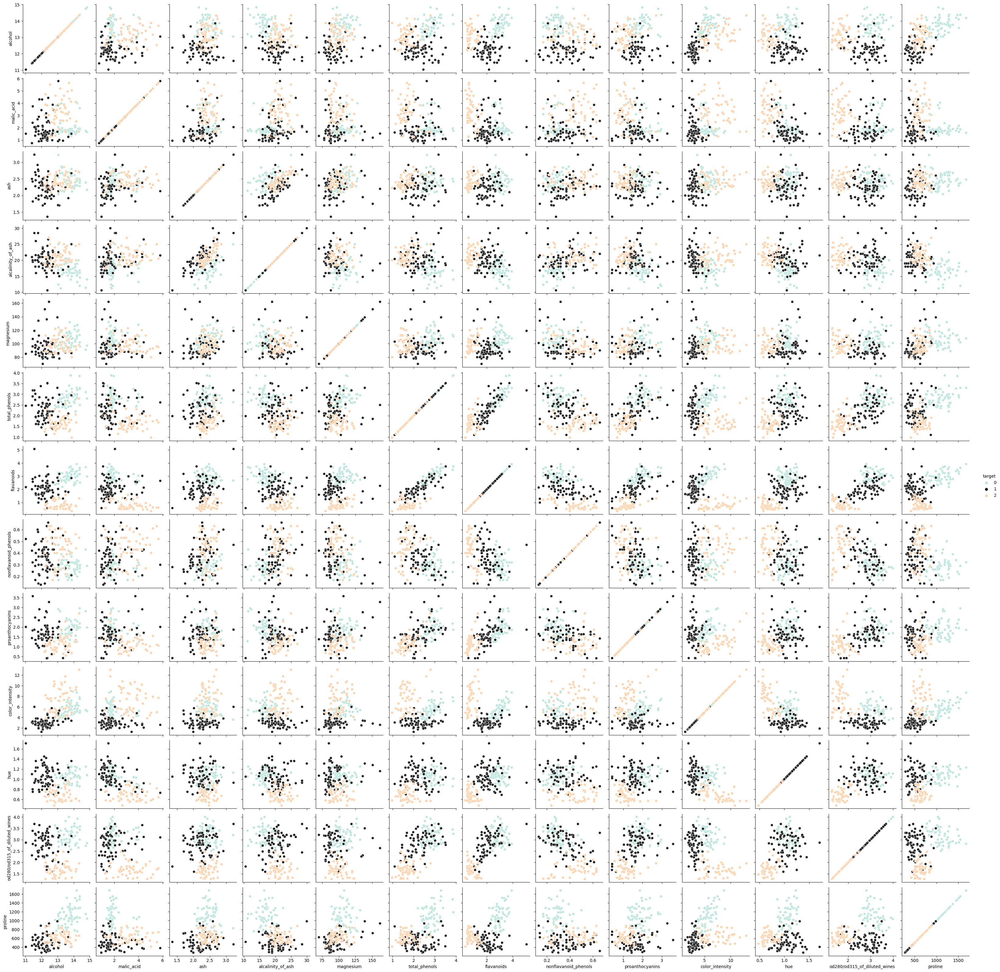

In [78]:
sns.pairplot(wines['frame'], hue = 'target', palette = 'icefire', diag_kind = None)
plt.draw()

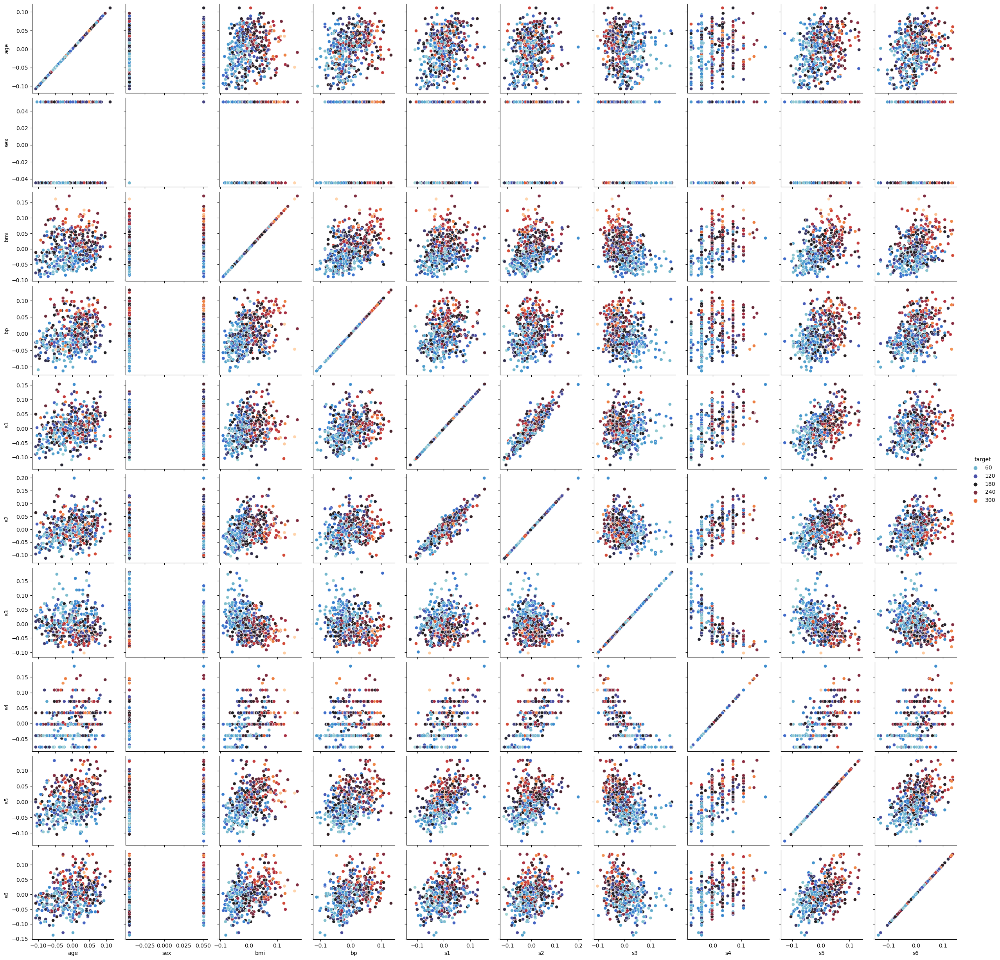

In [53]:
sns.pairplot(diabetes['frame'], hue = 'target', palette = 'icefire', diag_kind = None)
plt.draw()

## The decision tree as the first reference model<a class="anchor" id="decisiontree"></a>
Up to this point, we have only created sample data. Modeling is thus still pending. In order to understand the basic principle of machine learning algorithms on the one hand and to get to know the basic implementation of these algorithms in Python respectively scikit-learn on the other hand, we consider the decision tree as an example. [[3]](#sklearn2021c)

In [54]:
from sklearn import tree

The implementation of decision trees in scikit-learn allows their use for both classifications and regressions. This provides us with a tool for solving the problems created above, which may not lead to the best solution in many cases. However, decision trees have a high practical value due to their illustrativeness as well as the straightforward realization.

### Classification<a class="anchor" id="decisiontree_classification"></a>

In [55]:
# Split train and test set first
from sklearn.model_selection import train_test_split
Xc_train, Xc_test, yc_train, yc_test = train_test_split(Xc, yc,
                                                        test_size    = 0.2,
                                                        random_state = 42)

In [56]:
print(Xc_train.shape)
print(Xc_test.shape)
print(yc_train.shape)
print(yc_test.shape)

(80, 6)
(20, 6)
(80,)
(20,)


In [57]:
clf = tree.DecisionTreeClassifier()
clf

DecisionTreeClassifier()

In [58]:
clf = clf.fit(Xc_train, yc_train)
clf

DecisionTreeClassifier()

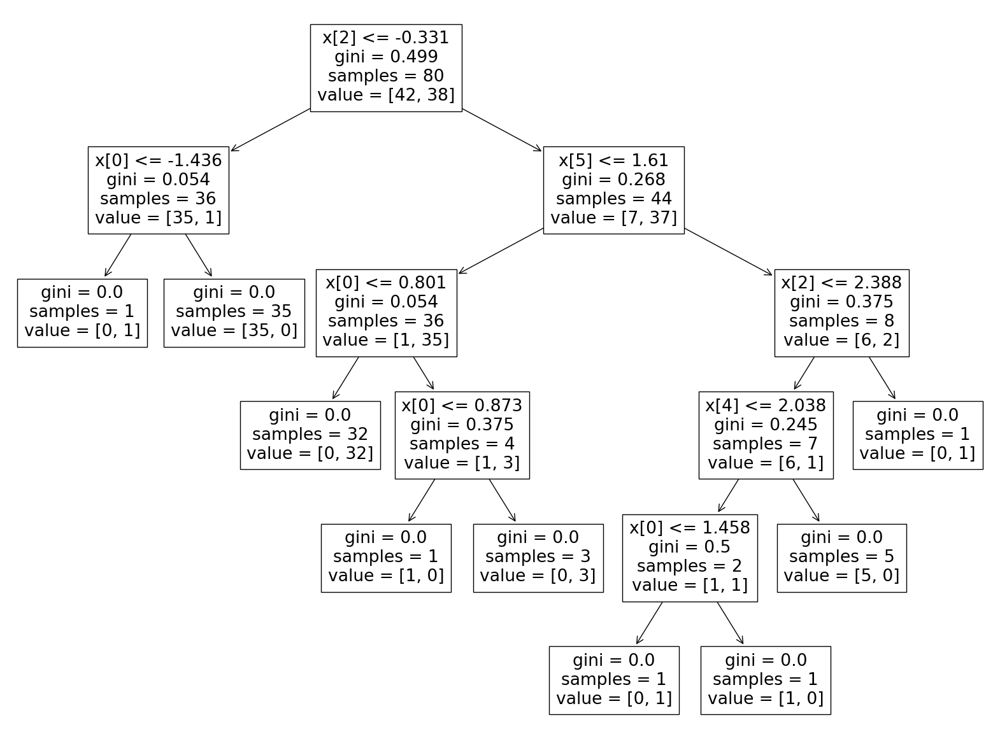

In [59]:
plt.figure(figsize = (20,15))
tree.plot_tree(clf)
plt.show()

In [60]:
yc_pred = clf.predict(Xc_test)
print(yc_pred)
print(yc_test)

[1 1 0 1 1 0 1 1 1 0 1 0 0 1 0 0 1 1 0 0]
[1 1 0 1 1 0 1 1 1 0 1 0 1 1 0 0 1 1 0 0]


In [61]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(clf, Xc_test, yc_test)  
plt.draw()

ImportError: cannot import name 'plot_confusion_matrix' from 'sklearn.metrics' (C:\Users\p\miniconda3\envs\mbb-agp\Lib\site-packages\sklearn\metrics\__init__.py)

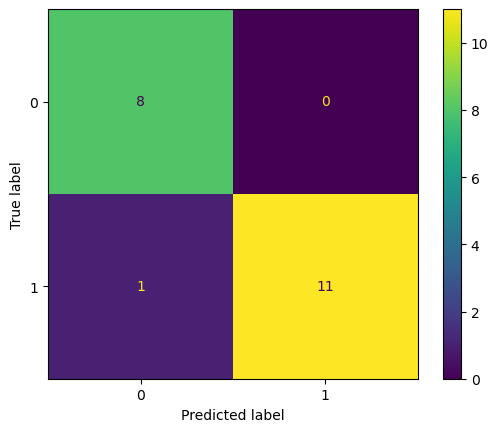

In [66]:
from sklearn.metrics import ConfusionMatrixDisplay as cmd
cmd.from_estimator(clf, Xc_test, yc_test)

In [62]:
from sklearn.metrics import accuracy_score
accuracy_score(yc_test, yc_pred)

0.95

### Regression<a class="anchor" id="decisiontree_regression"></a>

In [67]:
Xr_train, Xr_test, yr_train, yr_test = train_test_split(Xr, yr,
                                                        test_size    = 0.2,
                                                        random_state = 42)

In [68]:
print(Xr_train.shape)
print(Xr_test.shape)
print(yr_train.shape)
print(yr_test.shape)

(80, 5)
(20, 5)
(80,)
(20,)


In [69]:
regr = tree.DecisionTreeRegressor()
regr.fit(Xr_train, yr_train)

DecisionTreeRegressor()

In [70]:
yr_pred = regr.predict(Xr_test)
print(yr_pred)
print(yr_test)

[ -90.73339849 -208.31962443 -231.36564374   36.37016112 -173.27278023
 -173.27278023  -68.70339281  -45.55191994 -157.61806293  140.34594964
  140.34594964   67.83648013  126.75493947  272.52583414   56.94407542
  -90.73339849  -53.87997124  307.04234172  129.40011492    1.0723731 ]
[-162.83694309 -244.83966141 -155.47816356  -17.15194838   -7.95185511
    1.44857136 -222.82479326 -102.08544146 -211.84975471  -49.55452227
  -93.47833356  -18.63233309  141.60039025  141.39074843  -16.08318615
 -110.59741975  112.46769219  453.81829225 -158.50978159   39.79725084]


In [71]:
from sklearn.metrics import mean_squared_error
mean_squared_error(yr_test, yr_pred)

17893.444437148115

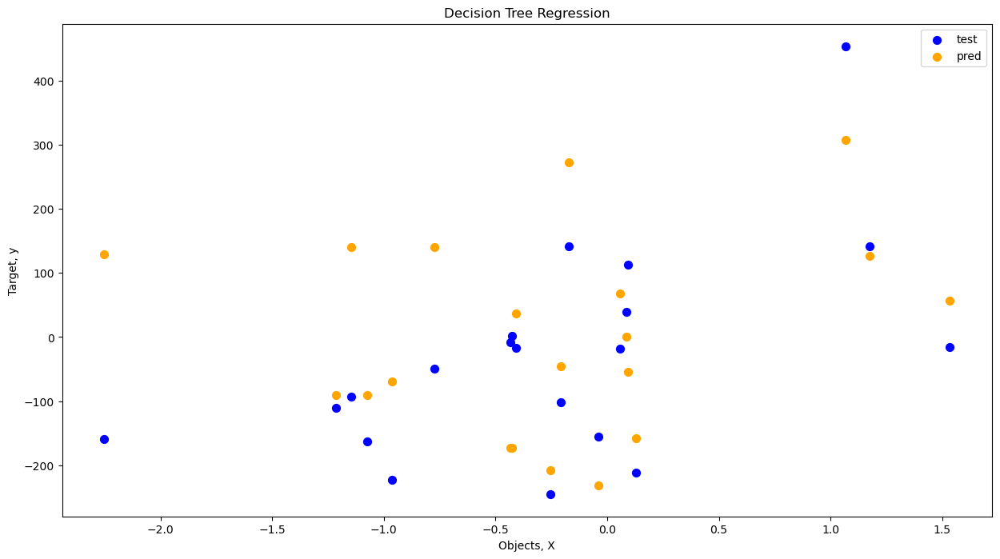

In [72]:
plt.figure(figsize = (15,8))
plt.scatter(Xr_test[:, 1], yr_test,
            s = 50, color = 'blue', label = "test")
plt.scatter(Xr_test[:, 1], yr_pred,
            s = 50, color = 'orange', label = 'pred')
plt.xlabel('Objects, X')
plt.ylabel("Target, y")
plt.title("Decision Tree Regression")
plt.legend()
plt.draw()

### Exercises<a class="anchor" id="decisiontree_exercises"></a>
1. Create a decision tree for each of the regression and classification problems you selected earlier from the Toy Datasets and interpret the result. Use only the default parameters of the tree.
2. Try to manually improve your result from 1. with the parameters of the decision tree.

#### Exercise 1: Wine Classification

##### Training

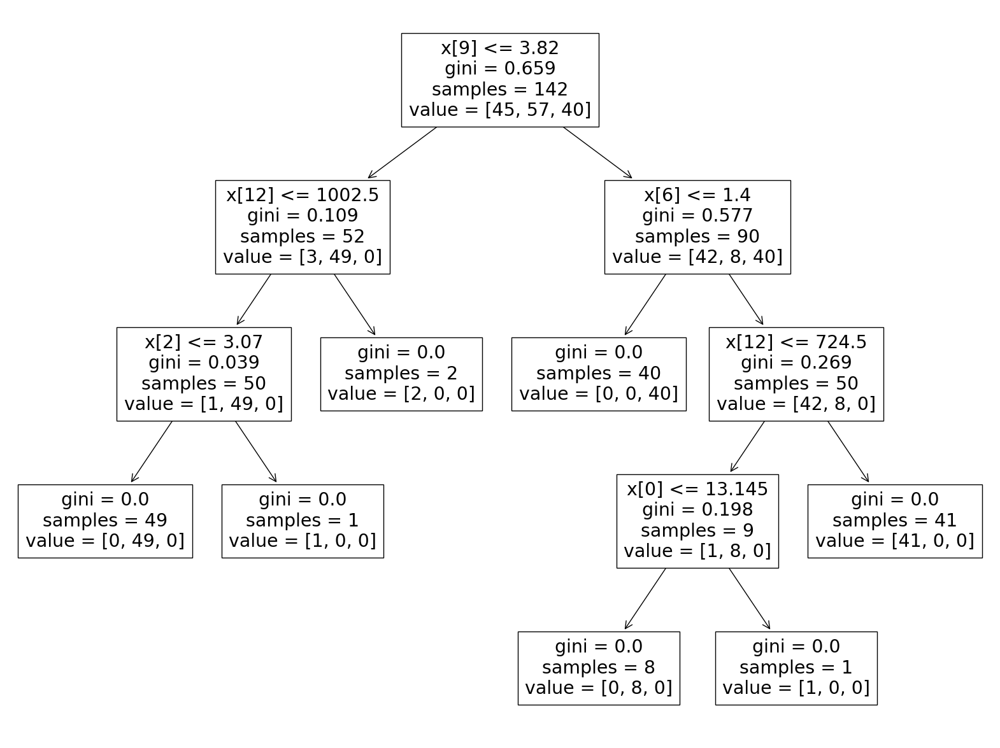

In [97]:
(Xwine, ywine) = load_wine(return_X_y=True)
(Xwine_train, Xwine_test, ywine_train, ywine_test) = train_test_split(
    Xwine,
    ywine,
    test_size=0.2,
    random_state=42
)

wineclf = tree.DecisionTreeClassifier(random_state=42)
wineclf.fit(Xwine_train, ywine_train)

plt.figure(figsize = (20,15))
tree.plot_tree(wineclf)
plt.show()

##### Prediction & Analysis

In [82]:
ywine_pred = wineclf.predict(Xwine_test)
print(f"{ywine_pred=}")
print(f"{ywine_test=}")

ywine_pred=array([0, 0, 2, 0, 1, 0, 1, 2, 1, 2, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1,
       1, 2, 2, 2, 1, 1, 1, 0, 0, 1, 2, 0, 0, 0])
ywine_test=array([0, 0, 2, 0, 1, 0, 1, 2, 1, 2, 0, 2, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1,
       1, 2, 2, 2, 1, 1, 1, 0, 0, 1, 2, 0, 0, 0])


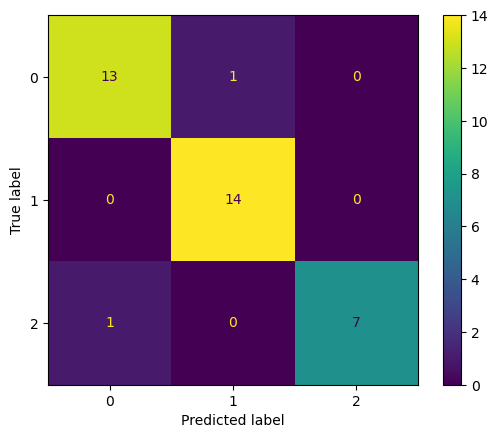

In [83]:
cmd.from_estimator(wineclf, Xwine_test, ywine_test)

#### Exercise 2: Diabetes Regression

##### Training

In [1]:
(Xdia, ydia) = load_diabetes(return_X_y=True)
Xdia.shape
(Xdia_train, Xdia_test, ydia_train, ydia_test) = train_test_split(
    Xdia,
    ydia,
    test_size=0.2,
    random_state=42
)

diareg = tree.DecisionTreeRegressor(random_state=42)
diareg.fit(Xdia_train, ydia_train)

plt.figure(figsize = (20,15))
tree.plot_tree(diareg)
plt.show()

NameError: name 'load_diabetes' is not defined

##### Analysis

In [89]:
ydia_pred = diareg.predict(Xdia_test)
print(f"{ydia_pred=}")
print(f"{ydia_test=}")

diareg_mse = mean_squared_error(ydia_test, ydia_pred)
print(f"{diareg_mse=}")

ydia_pred=array([217., 166., 170., 268., 183.,  87., 233., 262., 200., 173., 113.,
       200.,  72., 220.,  88., 142., 317., 200., 293., 163., 147.,  65.,
        49., 150.,  85., 127., 281., 162.,  59., 230., 279.,  50., 276.,
       292., 167., 180.,  51.,  74., 120.,  96.,  39.,  91., 199., 131.,
       170.,  65.,  52., 170.,  45., 179., 142.,  72., 144., 179., 292.,
       141.,  53., 178.,  53.,  59.,  67., 147., 142.,  91., 124., 144.,
        58.,  69., 150., 206., 206., 283., 241., 162., 132., 292., 220.,
       178., 122., 229.,  49.,  25.,  59.,  39.,  64.,  59.,  71.,  72.,
       147.])
ydia_test=array([219.,  70., 202., 230., 111.,  84., 242., 272.,  94.,  96.,  94.,
       252.,  99., 297., 135.,  67., 295., 264., 170., 275., 310.,  64.,
       128., 232., 129., 118., 263.,  77.,  48., 107., 140., 113.,  90.,
       164., 180., 233.,  42.,  84., 172.,  63.,  48., 108., 156., 168.,
        90.,  52., 200.,  87.,  90., 258., 136., 158.,  69.,  72., 171.,
        95.,  72.

<div style="width:image width px; font-size:75%;">
    <img src="img/weiss-ich-nicht-digga.gif" width="width" height="height" style="padding-bottom:0.2em;" />
</div>

##### Optimization

In [111]:

def _tune_regressor(X_train, y_train, X_test, y_test, **kwargs) -> float:
    """
    This function fits a Decision Tree Regressor on the provided training data and then predicts on the testing data.
    The mean squared error of the predictions is calculated and returned.
    
    The function allows for hyperparameter tuning by taking any number of keyword arguments which are passed directly to the Decision Tree Regressor constructor.

    Args:
        X_train (array-like, shape = [n_samples, n_features]): The training input samples.
        y_train (array-like, shape = [n_samples]): The target values (real numbers in regression).
        X_test (array-like, shape = [n_samples, n_features]): The testing input samples.
        y_test (array-like, shape = [n_samples]): The true values for X_test.
        **kwargs: Additional keyword arguments to be passed to the DecisionTreeRegressor.

    Returns:
        float: The mean squared error of the model predictions on the test data.

    Note: 
        The DecisionTreeRegressor is initialized with a fixed random state of 42 for reproducibility.
    """
    diareg_opt = tree.DecisionTreeRegressor(random_state=42, **kwargs)
    diareg_opt.fit(
        X_train,
        y_train
    )
    y_pred = diareg_opt.predict(X_test)
    y_mse = mean_squared_error(y_test, y_pred)
    
    return y_mse

def tune_regressor(**kwargs) -> float:
    return _tune_regressor(Xdia_train, ydia_train, Xdia_test, ydia_test, **kwargs)

print(f"{tune_regressor()=}")

tune_regressor()=4976.797752808989


From [[4]](#sklearn2023a), *Notes*:

> The default values for the parameters controlling the size of the trees (e.g. max_depth, min_samples_leaf, etc.) lead to fully grown and unpruned trees which can potentially be very large on some data sets. To reduce memory consumption, the complexity and size of the trees should be controlled by setting those parameter values.

So let's start with those.

In [145]:
print(f"{tune_regressor(max_depth=4)=}")
print(f"{tune_regressor(min_samples_leaf=5)=}")
print(f"{tune_regressor(min_samples_split=50)=}")

print(f"{tune_regressor(max_features='sqrt')=}")

print(f"{tune_regressor(ccp_alpha=0.1)=}")

tune_regressor(max_depth=4)=3568.9652613232283
tune_regressor(min_samples_leaf=5)=3419.9637575762717
tune_regressor(min_samples_split=50)=3290.945675558041
tune_regressor(max_features='sqrt')=5803.23595505618
tune_regressor(ccp_alpha=0.1)=4964.659126601951


## References<a class="anchor" id="references"></a>

[1]<a class="anchor" id="sklearn2021a"></a> The scikit-learn developers (2021). 7.3. Generated datasets. Retrieved 2021-04-18 from https://scikit-learn.org/stable/datasets/sample_generators.html

[2]<a class="anchor" id="sklearn2021b"></a> The scikit-learn developers (2021). 7.1. Toy datasets. Retrieved 2021-04-18 from https://scikit-learn.org/stable/datasets/toy_dataset.html

[3]<a class="anchor" id="sklearn2021c"></a> The scikit-learn developers (2021). 1.10. Decision Trees. Retrieved 2021-04-18 from https://scikit-learn.org/stable/modules/tree.html#decision-trees

[4]<a class="anchor" id="sklearn2023a"></a> The scikit-learn developers (2023). sklearn.tree.DecisionTreeRegressor. Retrieved 2023-05-13 from https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeRegressor.html